# **Object Proposal**

In [39]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
from torchvision.transforms import functional as F
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn

In [40]:
df = pd.read_csv("../Dataset/train_small.csv", header=None)
df.columns = ["Image", "Label"]
df.head()

,Image,Label
0,Image,Label
1,train_059371.jpg,0
2,train_059389.jpg,0
3,train_059425.jpg,0
4,train_059445.jpg,0


In [41]:
# Load Pre-trained Faster R-CNN
model = fasterrcnn_mobilenet_v3_large_320_fpn(
    weights="FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.COCO_V1"
)
model.eval()
rpn = model.rpn
transform = model.transform  # Get the model's transform

In [42]:
def apply_rpn(image_path, ax):
    # Load image using PIL
    image = Image.open(image_path).convert("RGB")

    # Convert to PyTorch tensor
    img_tensor = F.to_tensor(image).unsqueeze(0)  # Add batch dimension

    # Apply the model's transform to get proper ImageList
    with torch.no_grad():
        transformed_image_list = transform(img_tensor)[
            0
        ]  # Get the transformed ImageList
        features = model.backbone(transformed_image_list.tensors)

        # Apply RPN to get proposals
        proposals, _ = rpn(transformed_image_list, features)

    # Convert proposals to numpy and select top 50 proposals
    proposals = proposals[0].cpu().numpy()[:3]

    # Draw proposals on the image using PIL
    draw = ImageDraw.Draw(image)
    for x1, y1, x2, y2 in proposals:
        draw.rectangle([x1, y1, x2, y2], outline="red", width=2)

    # Show image with proposals using Matplotlib
    ax.imshow(image)
    ax.axis("off")

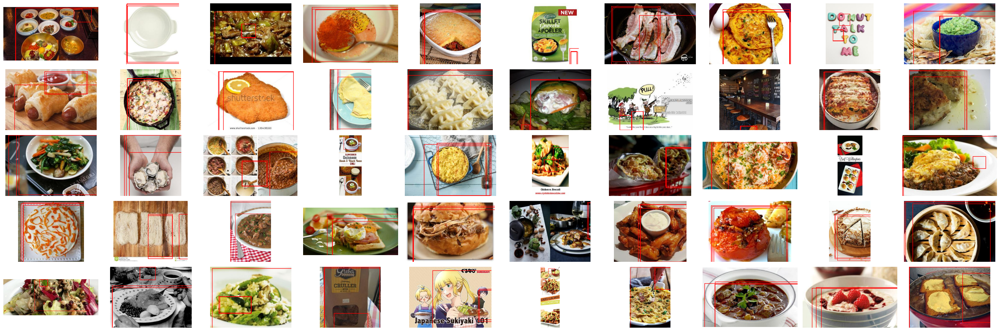

In [43]:
imgs = np.random.choice(df.Image, size=50)

fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  apply_rpn(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()

In [48]:
import cv2

def selective_search_proposals(image_path, ax, fast=True,):
    # Load Image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Create Selective Search object
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    
    # Use fast or quality mode
    if fast:
        ss.switchToSelectiveSearchFast()
    else:
        ss.switchToSelectiveSearchQuality()
    
    # Get region proposals
    rects = ss.process()
    
    # Draw top 100 proposals
    output = image.copy()
    for (x, y, w, h) in rects[:3]:
        cv2.rectangle(output, (x, y), (x + w, y + h), (255, 0, 0), 2)
    
    # Show results
    ax.imshow(output)
    ax.axis("off")
    
    return rects

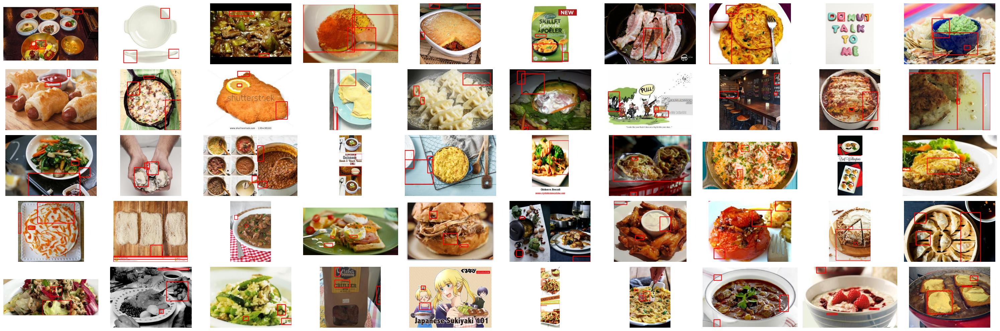

In [49]:
fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  selective_search_proposals(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()


# **Segmentation**

In [46]:
def grabcut_segmentation(image_path, ax):
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Define an initial rectangle (manual bounding box around food)
    height, width = image.shape[:2]
    rect = (int(width * 0.1), int(height * 0.2), int(width * 0.8), int(height * 0.7))  # Adjust as needed
    
    # Create mask and background/foreground models
    mask = np.zeros(image.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    
    # Apply GrabCut
    cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    
    # Create final mask: 0,2 -> background, 1,3 -> foreground
    mask_final = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    segmented = image * mask_final[:, :, np.newaxis]
    
    
    ax.imshow(segmented)
    ax.title.set_text(f"Segmented Image {image_path}")
    ax.axis("off")

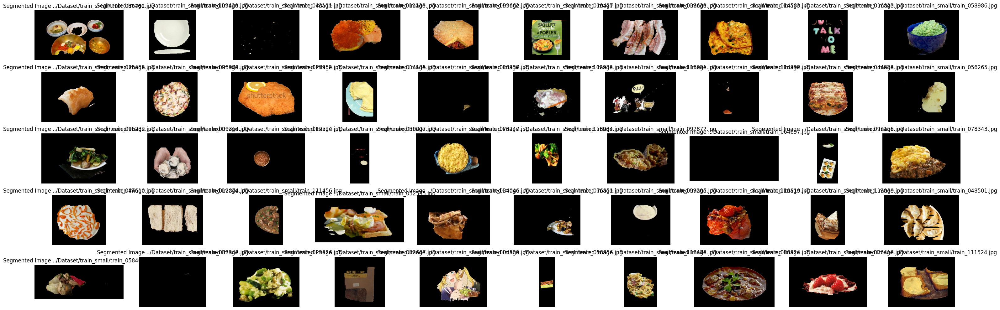

In [47]:
fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  grabcut_segmentation(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()